## ECE 9309/9039: Machine Learnin -  Final Project-Group 13
## Group Memebers:
## Seyedmostafa Mirmohammadi: 251397567  
## Wangyang Ye: 251385769
## Farzad Monsefpur: 251386662


# Import Packages

In [2]:

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.metrics import recall_score, make_scorer, mean_squared_error, confusion_matrix, roc_curve, auc, accuracy_score, f1_score, roc_auc_score
from sklearn.utils.multiclass import unique_labels
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.svm import SVC

from xgboost import XGBClassifier
from keras.models import Sequential, Model
from keras.layers import Dense, Input
#from keras.wrappers.scikit_learn import KerasClassifier
from scikeras.wrappers import KerasClassifier


from imblearn.over_sampling import SMOTE

# Plotting
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_columns', 500)

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')



# Read Data

In [4]:
#part 2:import data and preprocessing
df = pd.read_csv('project.csv')


# Drop the aformentioned columns
model_data = df.drop(['id'], axis = 'columns')

# Set up target variable (y) and features (X)
y = model_data.diagnosis
X = model_data.drop('diagnosis', axis='columns')

print (" Statistical Summary of the Data:")
print(X.describe(),"\n")


print(" Number of missing values that dataset contain",X.isnull().sum(),"\n")


print('Data set Size:',X.shape,"\n")

print("First 5 rows of dataset:")
X.head()
print(y[y == "B"].head())


 Statistical Summary of the Data:
       radius_mean  texture_mean  perimeter_mean    area_mean  \
count   569.000000    569.000000      569.000000   569.000000   
mean     14.127292     19.289649       91.969033   654.889104   
std       3.524049      4.301036       24.298981   351.914129   
min       6.981000      9.710000       43.790000   143.500000   
25%      11.700000     16.170000       75.170000   420.300000   
50%      13.370000     18.840000       86.240000   551.100000   
75%      15.780000     21.800000      104.100000   782.700000   
max      28.110000     39.280000      188.500000  2501.000000   

       smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
count       569.000000        569.000000      569.000000           569.000000   
mean          0.096360          0.104341        0.088799             0.048919   
std           0.014064          0.052813        0.079720             0.038803   
min           0.052630          0.019380        0.000000

# Data Preprocess

## Distrubution of labels

The distribution of labels (diagnosis results) in the dataset is as follows:

Benign (B) cases make up approximately 62.74%(357) of the dataset.
Malignant (M) cases account for approximately 37.26%(212).
This indicates that the dataset is relatively balanced between the two classes of diagnosis outcomes, with a slight predominance of benign cases over malignant ones.

Count of diagnosis:
B    357
M    212
Name: diagnosis, dtype: int64 



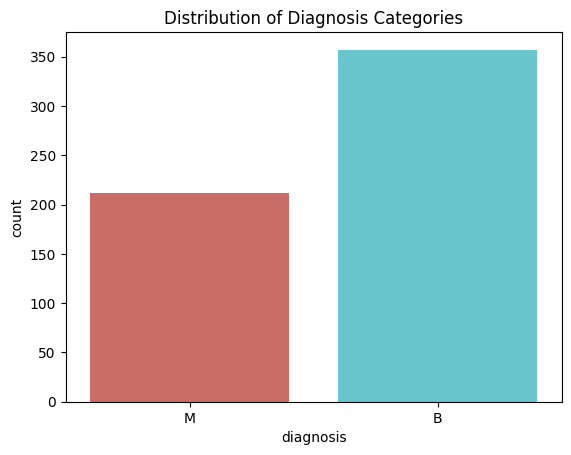

In [6]:
# Count of diagnosis
print("Count of diagnosis:")
print(y.value_counts(),"\n")
# plot diagnosis
sns.countplot(x='diagnosis', data=model_data, palette='hls')
plt.title('Distribution of Diagnosis Categories')
plt.show()

## Deal with features

The dataset contains a comprehensive set of features related to breast cancer tumors, which are categorized into three main groups based on their calculation methods: means, standard errors (SE), and "worst" (mean of the three largest values). Here's a breakdown of these features:

- **Mean Features**:
  - **radius_mean**: Mean of distances from center to points on the perimeter.
  - **texture_mean**: Standard deviation of gray-scale values.
  - **perimeter_mean**: Mean size of the core tumor.
  - **area_mean**: Area of the tumor.
  - **smoothness_mean**: Mean of local variation in radius lengths.
  - **compactness_mean**: Mean of perimeter^2 / area - 1.0.
  - **concavity_mean**: Mean of severity of concave portions of the contour.
  - **concave points_mean**: Mean for the number of concave portions of the contour.
  - **symmetry_mean**: Mean symmetry.
  - **fractal_dimension_mean**: Mean for "coastline approximation" - 1.

- **Standard Error Features**:
These features represent the standard error of the mean features listed above.

- **Worst Features**:
These features represent the mean of the three largest values of the respective mean features listed above.






In [7]:
X.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


### Standarlize

In [8]:
# Initialize the StandardScaler
scaler = StandardScaler()
# Fit and transform the features
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

### Visualization

In [9]:
# Separating out the features
features_mean = [col for col in X_scaled_df.columns if 'mean' in col]
features_se = [col for col in X_scaled_df.columns if 'se' in col]
features_worst = [col for col in X_scaled_df.columns if 'worst' in col]

#### histogram

- **Mean Features Distribution**: The histogram for the 'radius_mean' feature shows a roughly bell-shaped distribution, indicating that most of the tumors have a radius near the dataset mean. There is a peak slightly to the right of the center, suggesting a small skew towards larger radii.

- **SE Features Distribution**: The 'radius_se' histogram is more right-skewed compared to the 'radius_mean', with a tail extending towards higher standard error values. This indicates a variation in the standard error of the radius measurements, with fewer tumors having a higher standard error.

- **Worst Features Distribution**: The 'radius_worst' histogram also appears to be right-skewed, similar to the 'radius_se' distribution but with a broader spread. This suggests that the largest radius measurements among the tumors vary more than the average and standard error measurements.

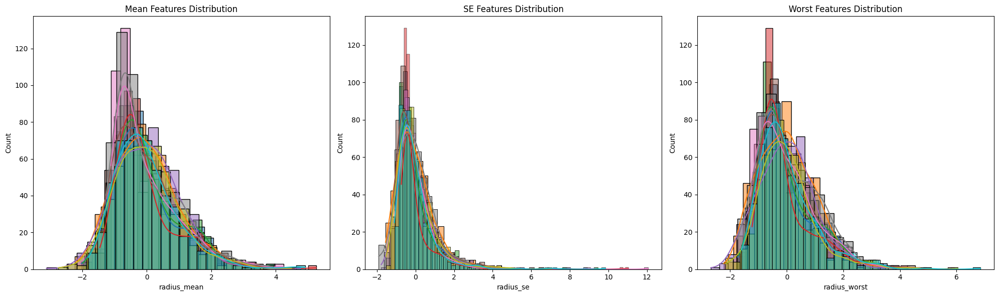

In [10]:
# Set the size of the plot
plt.figure(figsize=(20, 6))

# plot the histograms of the mean features
plt.subplot(1, 3, 1)
for feature in features_mean:
    sns.histplot(X_scaled_df[feature], kde=True, legend=True)
plt.title('Mean Features Distribution')

# plot the histograms of the se features
plt.subplot(1, 3, 2)
for feature in features_se:
    sns.histplot(X_scaled_df[feature], kde=True, legend=True)
plt.title('SE Features Distribution')

# plot the histograms of the worst features
plt.subplot(1, 3, 3)
for feature in features_worst:
    sns.histplot(X_scaled_df[feature], kde=True, legend=True)
plt.title('Worst Features Distribution')

plt.tight_layout()
plt.show()

Overall, these normalized features are already well suited for most machine learning algorithms

#### Box Plot

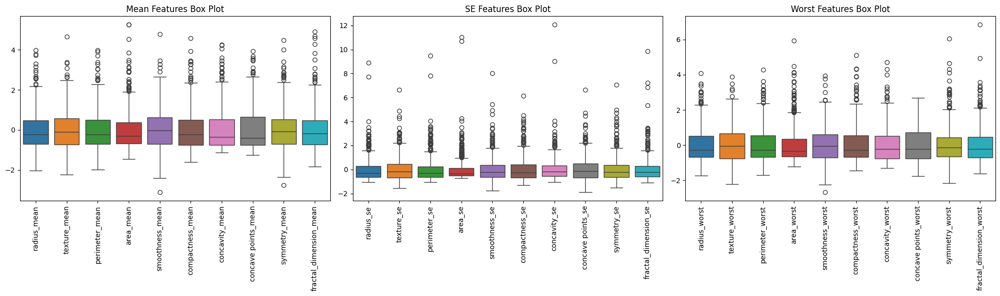

In [11]:
# Set the size of the plot
plt.figure(figsize=(20, 6))

# Plot the boxplots of the mean features
plt.subplot(1, 3, 1)
sns.boxplot(data=X_scaled_df[features_mean])
plt.title('Mean Features Box Plot')
plt.xticks(rotation=90)

# Plot the boxplots of the se features
plt.subplot(1, 3, 2)
sns.boxplot(data=X_scaled_df[features_se])
plt.title('SE Features Box Plot')
plt.xticks(rotation=90)

# Plot the boxplots of the worst features
plt.subplot(1, 3, 3)
sns.boxplot(data=X_scaled_df[features_worst])
plt.title('Worst Features Box Plot')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

- **Mean Features Box Plot**: Indicates a "mean" set of features. Most box plots have a median line (the line in the middle of the box) close to the center of the box, indicating a relatively symmetrical data distribution. Some box plots show outliers that are located farther above the box.

- **SE Features Box Plot**: Indicates the "se" feature group. The box plots for these features show more outliers, especially in the direction of high values. The range and outliers are more pronounced for the standard error features than for the "mean" features group, probably due to the variability of the original data.

- **Worst Features Box Plot**: Indicates the "worst" set of features. The box plot for this group of features also shows a significant number of outliers and a relatively wide range of feature values. This indicates that the maximum (or worst) value varies considerably between individuals.

#### Remove outliers

<font color='red'> It was verified that outliers do not affect the results, probably because the sample size itself is small. Therefore, the outliers will not be removed from the data. </font>

In [ ]:
# # Calculate the quartiles
# Q1 = scaled_features_df.quantile(0.25)
# Q3 = scaled_features_df.quantile(0.75)
# # Calculate the IQR
# IQR = Q3 - Q1

# # Create a condition to identify the outliers
# outliers_condition = (scaled_features_df < (Q1 - 1.5 * IQR)) | (scaled_features_df > (Q3 + 1.5 * IQR))

# # Remove the outliers
# data_no_outliers = scaled_features_df[~(outliers_condition).any(axis=1)]
# # Add the target variable back in
# data_no_outliers['diagnosis'] = model_data['diagnosis'][data_no_outliers.index]

# #Split the data into features and target label
# y = data_no_outliers.diagnosis
# X = data_no_outliers.drop('diagnosis', axis='columns')

# # Display the shape of the original data and the data after the outliers have been removed
# print(f"Original data size: {scaled_features_df.shape}")
# print(f"Data size after outlier removal: {data_no_outliers.shape}")

### Feature Engineering

#### Pairplot

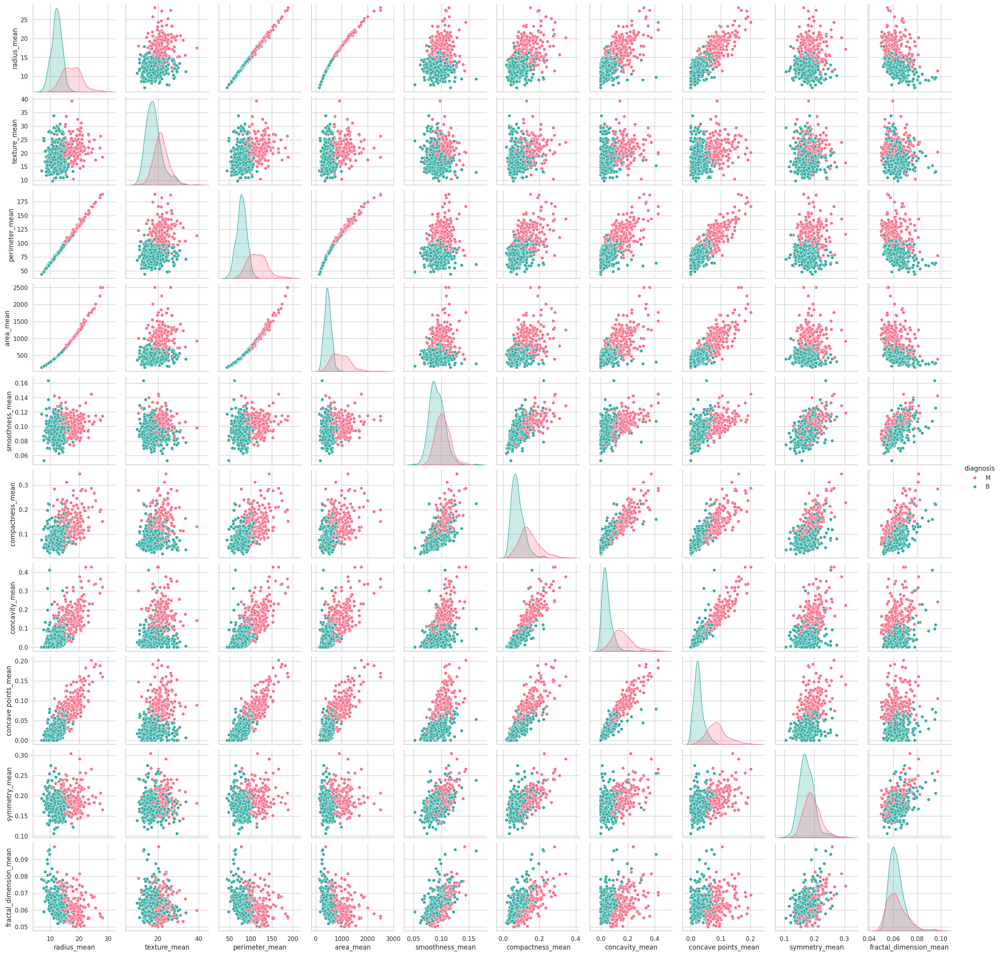

In [12]:
# set the size of the plot
sns.set(style="whitegrid")
# Plot the pairplot for the mean features
sns.pairplot(data=model_data, vars=features_mean, hue="diagnosis", palette="husl")
plt.show()

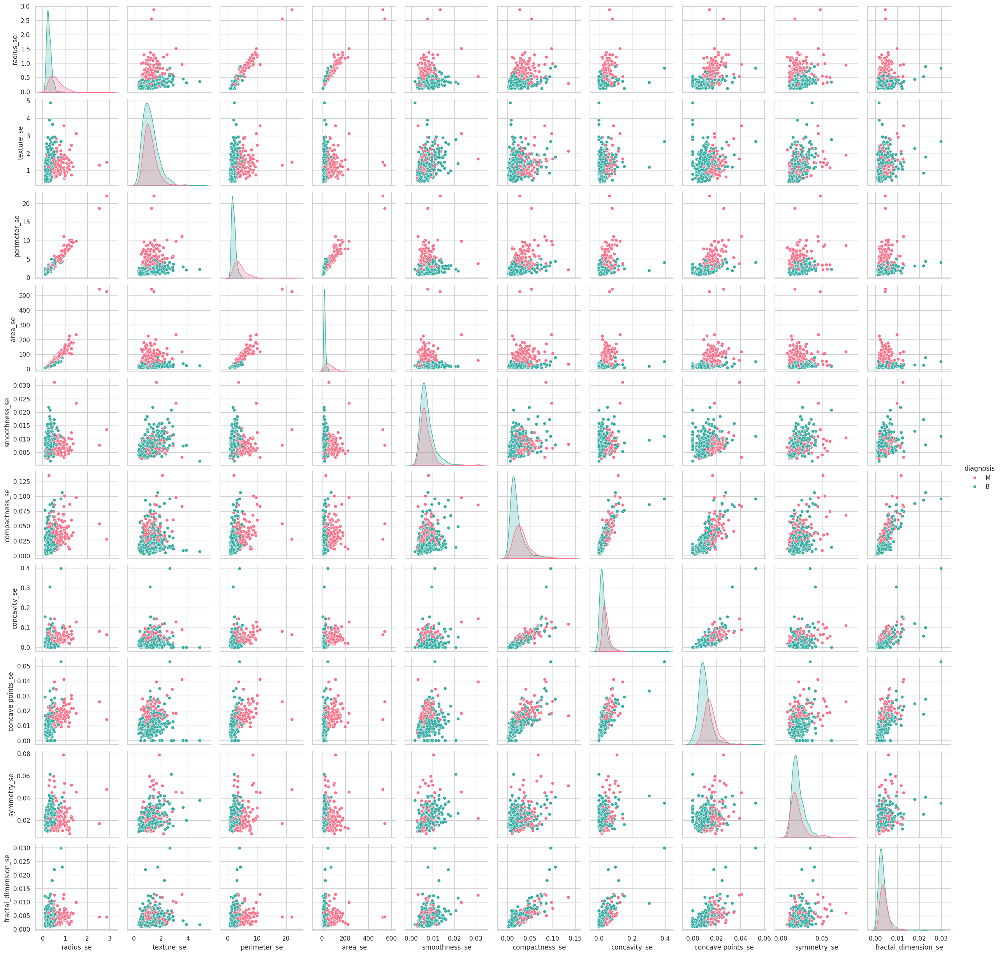

In [13]:
# Plot the pairplot for the se features
sns.pairplot(data=model_data, vars=features_se, hue="diagnosis", palette="husl")
plt.show()

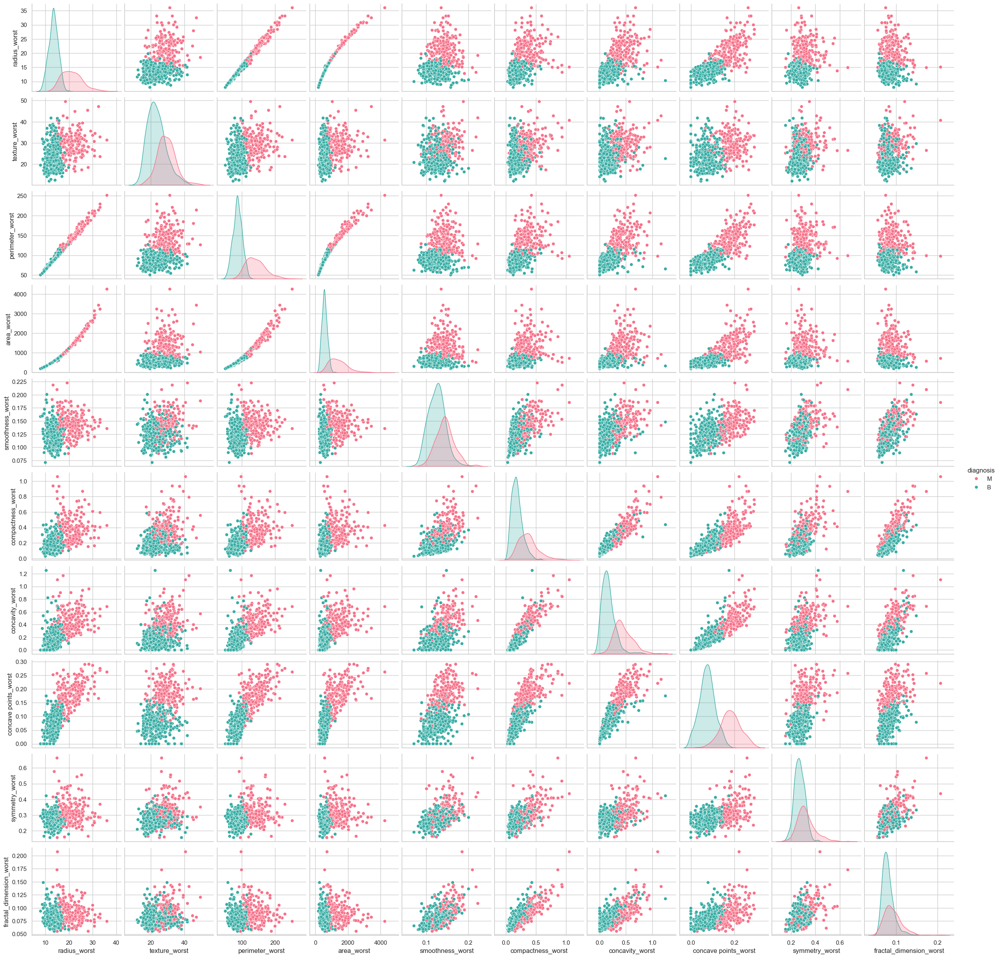

In [ ]:
# Plot the pairplot for the worst features
sns.pairplot(data=model_data, vars=features_worst, hue="diagnosis", palette="husl")
plt.show()

In [14]:
# Convert "diagnosis" column to 0 and 1
model_data['diagnosis'] = model_data['diagnosis'].apply(lambda x: 0 if x == 'B' else 1)

print(model_data.head())


   diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0          1        17.99         10.38          122.80     1001.0   
1          1        20.57         17.77          132.90     1326.0   
2          1        19.69         21.25          130.00     1203.0   
3          1        11.42         20.38           77.58      386.1   
4          1        20.29         14.34          135.10     1297.0   

   smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0          0.11840           0.27760          0.3001              0.14710   
1          0.08474           0.07864          0.0869              0.07017   
2          0.10960           0.15990          0.1974              0.12790   
3          0.14250           0.28390          0.2414              0.10520   
4          0.10030           0.13280          0.1980              0.10430   

   symmetry_mean  fractal_dimension_mean  radius_se  texture_se  perimeter_se  \
0         0.2419                 0.

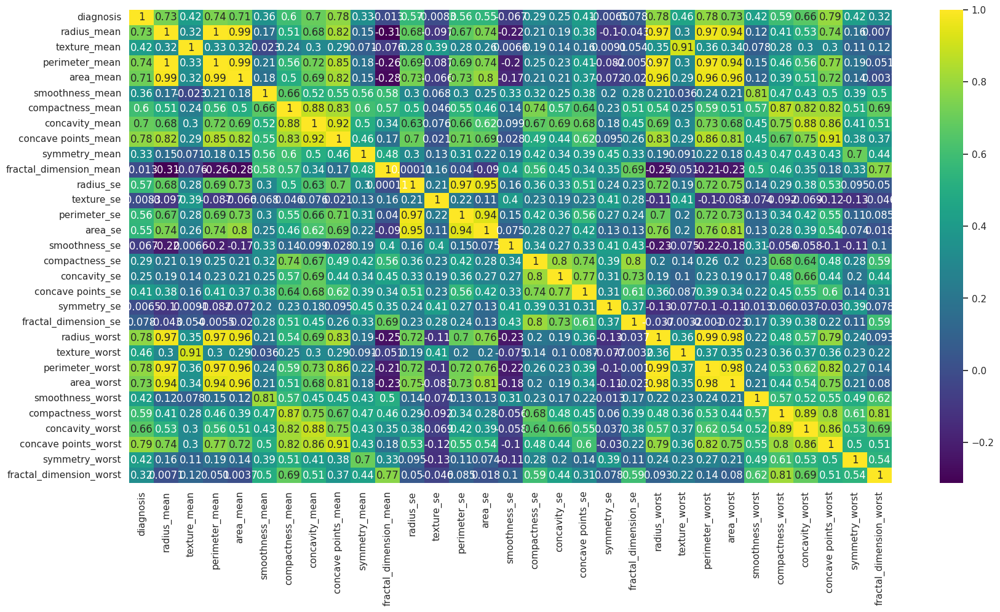

In [15]:
# Plot the correlation matrix
plt.figure(figsize=(20,10))
correlation = model_data.corr()
sns.heatmap(correlation, annot=True, cmap='viridis')
plt.show()

Upon reviewing the correlation heatmap, we observe that:

- ```radius_mean```, ```perimeter_mean```, and ```area_mean``` are highly correlated.
  - Decision: Only ```area_mean``` is used.
  - Justification: The choice is somewhat subjective; ```area_mean``` seemed clearer in the swarm plots. However, the true test comes from evaluating model performance.

- ```compactness_mean```, ```concavity_mean```, and ```concave points_mean``` are correlated.
  - Decision: Only ```concavity_mean``` is used.
  - Justification: Looking for features that provide unique information without redundancy.

- ```radius_se```, ```perimeter_se```, and ```area_se``` are correlated.
  - Decision: Only ```area_se``` is used.
  - Justification: Chosen for its clear distinction in the swarm plots.

- ```radius_worst```, ```perimeter_worst```, and ```area_worst``` are ```correlated```.
  - Decision: Only ```area_worst``` is used.
  - Justification: Consistency with previous decisions prioritizing area measurements.

- ```compactness_worst```, ```concavity_worst```, and ```concave points_worst``` are correlated.
  - Decision: Only ```concavity_worst``` is used.
  - Justification: Preference for concavity as a discriminative feature.

- ```compactness_se```, ```concavity_se```, and ```concave points_se``` are correlated.
  - Decision: Only ```concavity_se``` is used.
  - Justification: Maintaining concavity as a feature of interest.

- ```texture_mean``` and ```texture_worst``` are correlated.
  - Decision: Only ```texture_mean``` is used.
  - Justification: Reduced feature set based on initial feature selection.

- ```area_worst``` and ```area_mean``` are correlated.
  - Decision: area_mean is retained.
  - Justification: The earlier decision to use ```area_mean``` influenced this choice.

In [7]:
## Drop selected features from the dataset
drop_list = ['perimeter_mean','radius_mean','compactness_mean','concave points_mean','radius_se','perimeter_se','radius_worst','perimeter_worst','compactness_worst','concave points_worst','compactness_se','concave points_se','texture_worst','area_worst']
x_dropped = X.drop(drop_list,axis = 1 )
x_dropped.head()

,texture_mean,area_mean,smoothness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,concavity_se,symmetry_se,fractal_dimension_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
0,10.38,1001.0,0.11840,0.3001,0.2419,0.07871,0.9053,153.40,0.006399,0.05373,0.03003,0.006193,0.1622,0.7119,0.4601,0.11890
1,17.77,1326.0,0.08474,0.0869,0.1812,0.05667,0.7339,74.08,0.005225,0.01860,0.01389,0.003532,0.1238,0.2416,0.2750,0.08902
2,21.25,1203.0,0.10960,0.1974,0.2069,0.05999,0.7869,94.03,0.006150,0.03832,0.02250,0.004571,0.1444,0.4504,0.3613,0.08758
3,20.38,386.1,0.14250,0.2414,0.2597,0.09744,1.1560,27.23,0.009110,0.05661,0.05963,0.009208,0.2098,0.6869,0.6638,0.17300
4,14.34,1297.0,0.10030,0.1980,0.1809,0.05883,0.7813,94.44,0.011490,0.05688,0.01756,0.005115,0.1374,0.4000,0.2364,0.07678


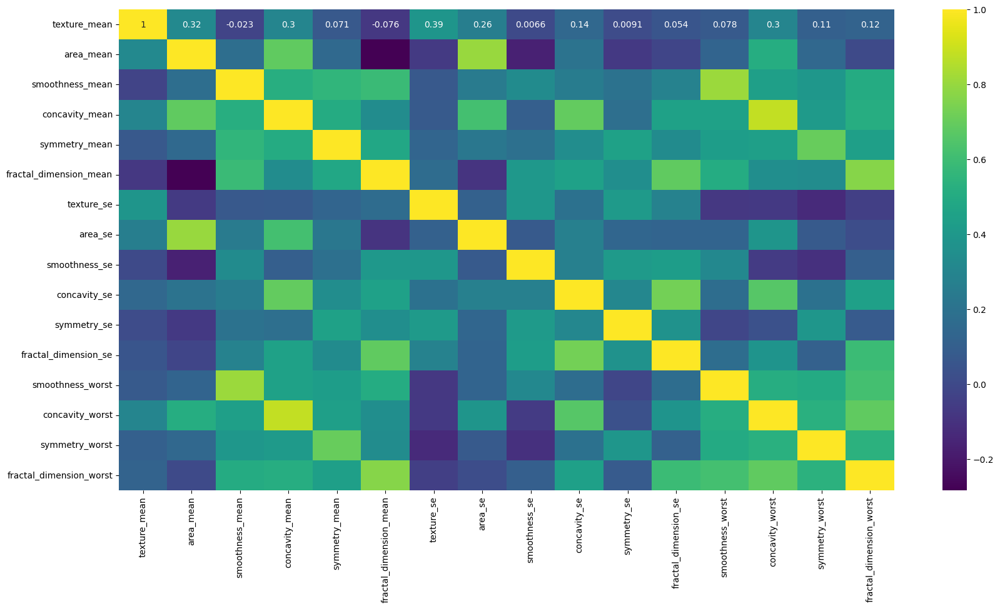

In [8]:
# Plot the correlation matrix again
plt.figure(figsize=(20,10))
correlation = x_dropped.corr()
sns.heatmap(correlation, annot=True, cmap='viridis')
plt.show()

# Modeling

In [9]:

# Random state assures that folds are consistent across models

Xtrain, Xtest, ytrain, ytest = train_test_split(x_dropped,y,test_size=0.2,random_state=1220) # Set to 20% ,
print('Training set size:',Xtrain.shape)

# Count of diagnosis in y_test
print("Count of diagnosis in y_test:")
print(ytest.value_counts(), "\n")

# Count of samples in x_test
print("Count of samples in x_test:")
print(Xtest.shape[0], "\n")

# Count of classes in y_test
print("Count of classes in y_test:")
print(pd.Series(ytest).value_counts())


# Convert training set targets to 1-0 categorical classes
ytrain = np.where(ytrain == "B", 0, 1)
# Convert ytrain to a pandas DataFrame
ytrain = pd.DataFrame({'Target': ytrain})

# Convert testing set targets to 1-0 categorical classes
ytest = np.where(ytest == "B", 0, 1)
# Convert ytest to a pandas DataFrame
ytest = pd.DataFrame({'Target': ytest})


# Display the first 5 rows of Xtrain
print("First 5 rows of Xtrain:")
print(Xtrain.head())

# Display the first 5 rows of ytrain
print("\nFirst 5 rows of ytrain:")
print(ytrain.head())

Training set size: (455, 16)
Count of diagnosis in y_test:
diagnosis
B    70
M    44
Name: count, dtype: int64 

Count of samples in x_test:
114 

Count of classes in y_test:
diagnosis
B    70
M    44
Name: count, dtype: int64
First 5 rows of Xtrain:
     texture_mean  area_mean  smoothness_mean  concavity_mean  symmetry_mean  \
176         18.06      302.4          0.09699         0.13070         0.1669   
200         19.56      461.0          0.09586         0.04187         0.1979   
5           15.70      477.1          0.12780         0.15780         0.2087   
130         13.29      455.8          0.10660         0.02855         0.1880   
216         18.35      432.2          0.09363         0.06636         0.1967   

     fractal_dimension_mean  texture_se  area_se  smoothness_se  concavity_se  \
176                 0.08116      2.2610    27.48       0.012860       0.11970   
200                 0.06013      1.3260    27.24       0.007514       0.01401   
5                   0.076

In [20]:
# Print the number of samples in Xtrain and ytrain
print("Number of samples in Xtrain:", len(Xtrain))
print("Number of samples in ytrain:", len(ytrain))


Number of samples in Xtrain: 455
Number of samples in ytrain: 455


## Balancing Data

Count of diagnosis after SMOTE for target variable:
0    287
1    287
Name: count, dtype: int64 

Count of samples(X) after SMOTE for feature set:
574 



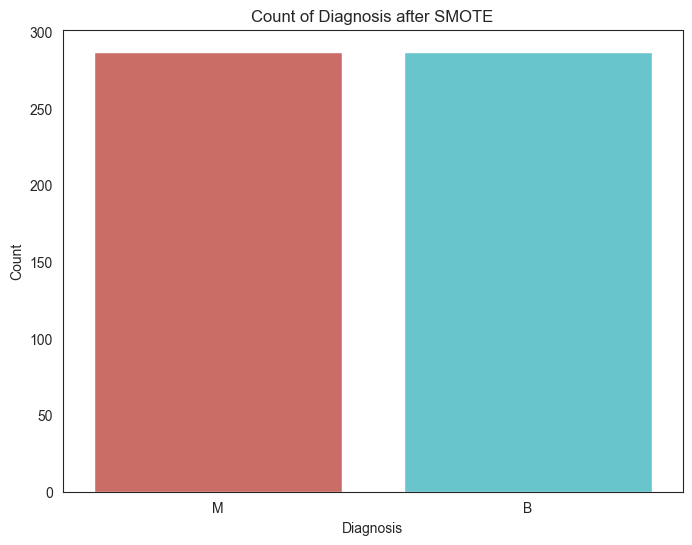

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE

# Apply SMOTE to balance the classes
smote = SMOTE(random_state=2022)

# Convert ytrain and ytest back to numpy arrays
ytrain_array = ytrain.to_numpy().reshape(-1,)


Xtrain_balanced, ytrain_balanced = smote.fit_resample(Xtrain, ytrain_array)

# Display the count of classes after applying SMOTE for the target variable
print("Count of diagnosis after SMOTE for target variable:")
print(pd.Series(ytrain_balanced).value_counts(), "\n")

# Display the count of samples after applying SMOTE for the feature set
print("Count of samples(X) after SMOTE for feature set:")
print(Xtrain_balanced.shape[0], "\n")
sns.set_style("white")


# Set the Seaborn style to white without grid lines
sns.set_style("white")

# After balancing
# Convert the numpy array to a pandas Series
ytrain_balanced_series = pd.Series(ytrain_balanced)

# Convert training set targets from 0 and 1 to 'B' and 'M'
ytrain_balanced_mapped = ytrain_balanced_series.map({1: 'M', 0: 'B'})

# Create a countplot using Seaborn with the mapped target variable
plt.figure(figsize=(8, 6))
sns.countplot(x=ytrain_balanced_mapped, palette='hls', order=['M', 'B'])
plt.title('Count of Diagnosis after SMOTE')
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.show()

# Convert training set targets to 1-0 categorical classes
ytrain_balanced = pd.DataFrame({'Target': ytrain_balanced})





### Standardization(Scaling Data)

In [11]:
# Initialize the StandardScaler
scaler = StandardScaler()
# Fit and transform the features
Xtrain_standardscale = scaler.fit_transform(Xtrain_balanced.values)
Xtest_standardscale = scaler.transform(Xtest.values)

In [12]:
## Print the number of samples in Xtrain_standardscale and ytrain_balanced
print("Number of samples in Xtrain_standardscale:", len(Xtrain_standardscale))
print("Number of samples in ytrain:", len(ytrain_balanced))

Number of samples in Xtrain_standardscale: 574
Number of samples in ytrain: 574


## Logistic Regression

In [24]:
#instantiate a logistic regression model
#max iteration parameter changed from default of 100 to allow model to converge to soltion
logestic_model = LogisticRegression(max_iter=1000000)
#fit the logistic regression model to the training set
logestic_model.fit(Xtrain_standardscale, ytrain_balanced)
#predict the class for the testing set and store them in a variable y_pred2
ypred = logestic_model.predict(Xtest_standardscale)

The confusion matrix function returned:
True Negatives:		69
True Positives:		43
False Negatives:	1
False Positives:	1



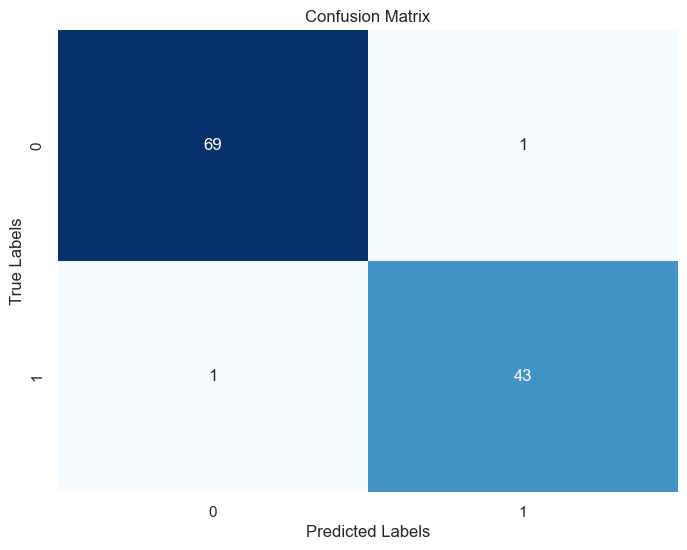

The manually computed Accuracy is:	0.9824561403508771
The Accuracy computed by Sklearn is:	0.9824561403508771



In [ ]:
#calculate classification metrics

#confusion matrix
tn, fp, fn, tp = confusion_matrix(ytest, ypred).ravel()
print("The confusion matrix function returned:\nTrue Negatives:\t\t{0}\nTrue Positives:\t\t{1}\nFalse Negatives:\t{2}\nFalse Positives:\t{3}\n".format(tn,tp,fn,fp))

#plot confusion matrix
# Compute confusion matrix
conf_matrix = confusion_matrix(ytest, ypred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


#accuracy
manual_accuracy = (tp + tn)/(tp + tn + fp +fn)
calculated_accuracy = accuracy_score(ytest, ypred)
print("The manually computed Accuracy is:\t{0}".format(manual_accuracy))
print("The Accuracy computed by Sklearn is:\t{0}\n".format(calculated_accuracy))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate the RMSE on the test set
test_rmse = np.sqrt(mean_squared_error(ytest, ypred))
print("Test Set RMSE Score:", test_rmse)


# Calculate accuracy
accuracy = accuracy_score(ytest, ypred)

# Calculate precision
precision = precision_score(ytest, ypred)

# Calculate recall
recall = recall_score(ytest, ypred)

# Calculate F1-score
f1 = f1_score(ytest, ypred)

print("Test Set Accuracy Score:", accuracy)
print("Test Set Precision Score:", precision)
print("Test Set Recall Score:", recall)
print("Test Set F1-Score:", f1)

# Calculate confusion matrix
confusion_matrix_logesticregrission = confusion_matrix(ytest, ypred)
print("Confusion Matrix:")
print(confusion_matrix_logesticregrission)

Test Set RMSE Score: 0.13245323570650439
Test Set Accuracy Score: 0.9824561403508771
Test Set Precision Score: 0.9772727272727273
Test Set Recall Score: 0.9772727272727273
Test Set F1-Score: 0.9772727272727273
Confusion Matrix:
[[69  1]
 [ 1 43]]


## Random Forests
Now we will train a random forest. It is included in the sklearn.ensemble subpackage, function RandomForestClassifier, so it is straightforward to use. It comes with many parameters, but in general there is a philosophy to follow::

In [ ]:
#Define the classifier
breastcancer_rf = RandomForestClassifier(n_estimators=1000, # Number of trees to train
                       criterion='gini', # How to train the trees. Also supports entropy.
                       max_depth=None, # Max depth of the trees. Not necessary to change.
                       min_samples_split=2, # Minimum samples to create a split.
                       min_samples_leaf=0.001, # Minimum samples in a leaf. Accepts fractions for %. This is 0.1% of sample.
                       min_weight_fraction_leaf=0.0, # Same as above, but uses the class weights.
                       max_features=None, # Maximum number of features per split (not tree!) by default is sqrt(vars)
                       max_leaf_nodes=None, # Maximum number of nodes.
                       min_impurity_decrease=0.0001, # Minimum impurity decrease. This is 10^-3.
                       bootstrap=True, # If sample with repetition. For large samples (>100.000) set to false.
                       oob_score=True,  # If report accuracy with non-selected cases.
                       n_jobs=-1, # Parallel processing. Set to -1 for all cores. Watch your RAM!!
                       random_state=20190305, # Seed
                       verbose=1, # If to give info during training. Set to 0 for silent training.
                       warm_start=False, # If train over previously trained tree.
                       class_weight='balanced'
                                    )

In [ ]:
## Fit the Random Forest classifier to the standardized training data
breastcancer_rf.fit(Xtrain_standardscale, ytrain_balanced)

# Apply the model to the test set.
rf_pred_class_test = breastcancer_rf.predict(Xtest_standardscale)
rf_probs_test = breastcancer_rf.predict_proba(Xtest_standardscale)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 760 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    1.2s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.0s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elaps

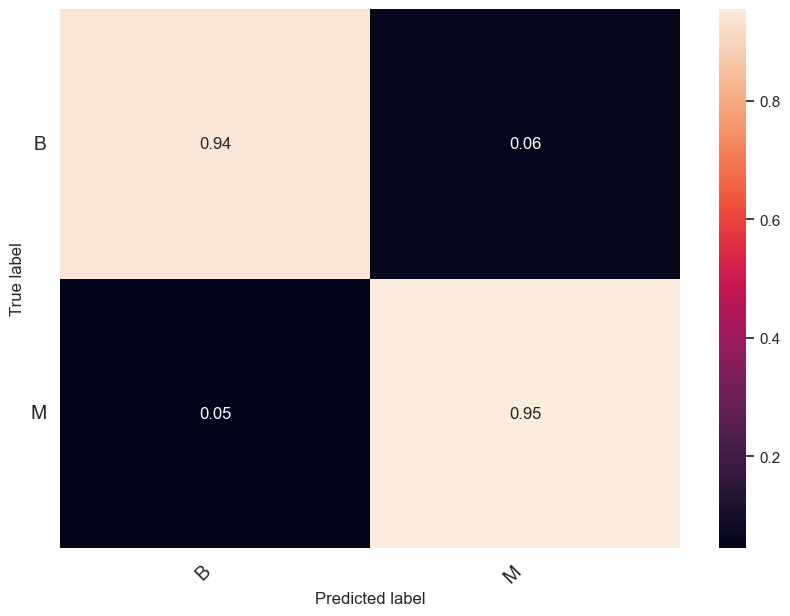

In [ ]:
# Calculate confusion matrix
confusion_matrix_rf = confusion_matrix(ytest, rf_pred_class_test)

# Turn matrix to percentages
confusion_matrix_rf = confusion_matrix_rf.astype('float') / confusion_matrix_rf.sum(axis=1)[:, np.newaxis]

# Turn to dataframe
df_cm = pd.DataFrame(
    confusion_matrix_rf,
    index=['B', 'M'],  # Update labels to reflect 'B' (benign) and 'M' (malignant)
    columns=['B', 'M'],
)

# Parameters of the image
figsize = (10, 7)
fontsize = 14

# Create image
fig = plt.figure(figsize=figsize)
heatmap = sns.heatmap(df_cm, annot=True, fmt='.2f')

# Make it nicer
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)

# Add labels
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Plot!
plt.show()


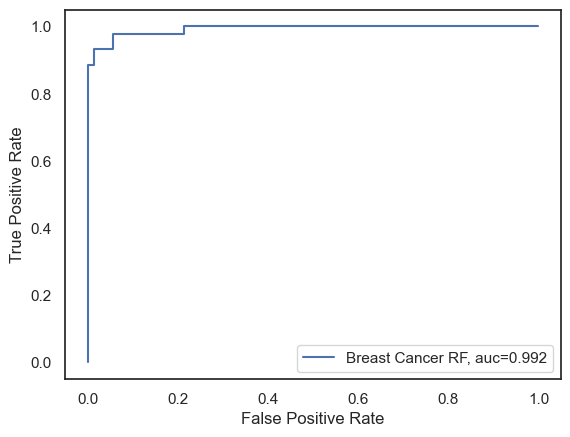

In [ ]:
# Calculate the ROC curve points
fpr, tpr, thresholds = roc_curve(ytest, rf_probs_test[:, 1], pos_label=1)

# Save the AUC in a variable to display it. Round it first
auc = np.round(roc_auc_score(ytest, rf_probs_test[:, 1]), decimals=3)

# Create and show the plot
plt.plot(fpr, tpr, label="Breast Cancer RF, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

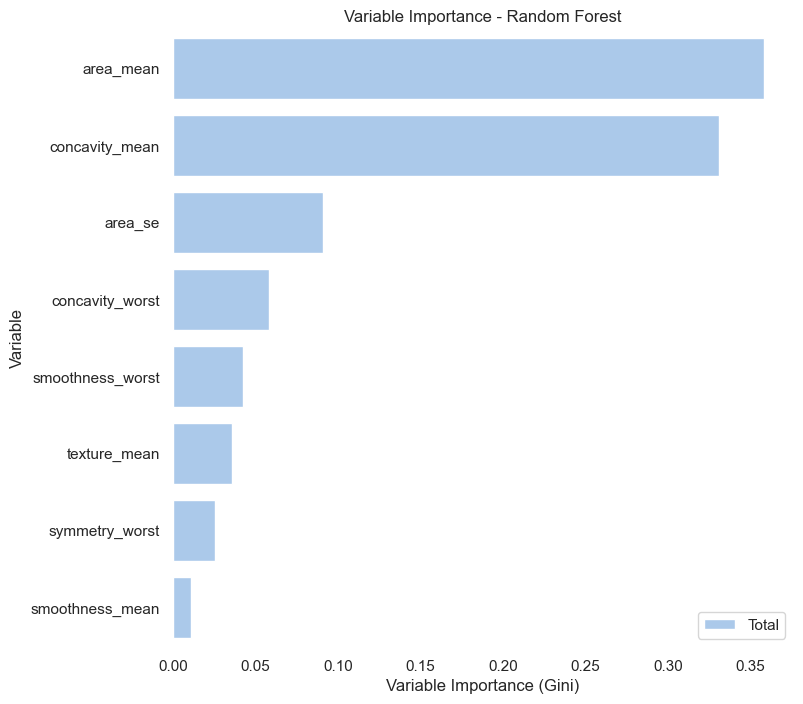

In [ ]:
# Plot variable importance
importances = breastcancer_rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Get column names of the features excluding the target variable
feature_names = Xtrain.columns[:-1]

# Ensure that the number of features matches the length of the importance scores
num_features = min(len(indices), len(feature_names))

# Limit the number of features displayed to match the available data
num_displayed_features = min(8, num_features)  # Display top 10 features
indices_to_display = indices[:num_displayed_features]

# Plot variable importance using a bar plot
f, ax = plt.subplots(figsize=(8, num_displayed_features))
plt.title("Variable Importance - Random Forest")

# Set color codes
sns.set_color_codes("pastel")

# Create the bar plot
sns.barplot(y=[feature_names[i] for i in indices_to_display], 
            x=importances[indices_to_display],
            label="Total", color="b")

# Set labels for axes
ax.set(ylabel="Variable",
       xlabel="Variable Importance (Gini)")

# Remove spines from the plot
sns.despine(left=True, bottom=True)

# Display the plot
plt.show()



#the code provides a visual representation of the importance of each feature in the Random Forest model,
#helping to identify which features are most influential in making predictions.



In [ ]:
#random Forest Performance measurment
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Train the Random Forest classifier
breastcancer_rf.fit(Xtrain_standardscale, ytrain_balanced)

# Predict classes for the test set
rf_pred_class_test = breastcancer_rf.predict(Xtest_standardscale)

# Calculate predicted probabilities for the test set
rf_probs_test = breastcancer_rf.predict_proba(Xtest_standardscale)

# Calculate accuracy
accuracy_rf = accuracy_score(ytest, rf_pred_class_test)
print("Test Set Accuracy Score:", accuracy_rf)

# Calculate precision
precision_rf = precision_score(ytest, rf_pred_class_test)
print("Test Set Precision Score:", precision_rf)

# Calculate recall
recall_rf = recall_score(ytest, rf_pred_class_test)
print("Test Set Recall Score:", recall_rf)

# Calculate F1-score
f1_rf = f1_score(ytest, rf_pred_class_test)
print("Test Set F1-Score:", f1_rf)

# Calculate confusion matrix
confusion_matrix_rf = confusion_matrix(ytest, rf_pred_class_test)
print("Confusion Matrix:")
print(confusion_matrix_rf)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 760 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.0s


Test Set Accuracy Score: 0.9473684210526315
Test Set Precision Score: 0.9130434782608695
Test Set Recall Score: 0.9545454545454546
Test Set F1-Score: 0.9333333333333332
Confusion Matrix:
[[66  4]
 [ 2 42]]


[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.0s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.0s finished


## XGBoosting

In [26]:
#Define the classifier.
XGB_BreastCancer = XGBClassifier(max_depth=3,                 # Depth of each tree
                            learning_rate=0.1,            # How much to shrink error in each subsequent training. Trade-off with no. estimators.
                            n_estimators=100,             # How many trees to use, the more the better, but decrease learning rate if many used.
                            verbosity=1,                  # If to show more errors or not.
                            objective='binary:logistic',  # Type of target variable.
                            booster='gbtree',             # What to boost. Trees in this case.
                            n_jobs=2,                     # Parallel jobs to run. Set your processor number.
                            gamma=0.001,                  # Minimum loss reduction required to make a further partition on a leaf node of the tree. (Controls growth!)
                            subsample=1,                  # Subsample ratio. Can set lower
                            colsample_bytree=1,           # Subsample ratio of columns when constructing each tree.
                            colsample_bylevel=1,          # Subsample ratio of columns when constructing each level. 0.33 is similar to random forest.
                            colsample_bynode=1,           # Subsample ratio of columns when constructing each split.
                            reg_alpha=1,                  # Regularizer for first fit. alpha = 1, lambda = 0 is LASSO.
                            reg_lambda=0,                 # Regularizer for first fit.
                            scale_pos_weight=1,           # Balancing of positive and negative weights.
                            base_score=0.5,               # Global bias. Set to average of the target rate.
                            random_state=20201107,        # Seed
                            missing=None                  # How are nulls encoded?
                            )

In [27]:
# Define the parameters. Play with this grid!
param_grid = dict({'n_estimators': [50, 100, 150],
                   'max_depth': [2, 3],
                 'learning_rate' : [0.001, 0.01, 0.1]
                  })

In [28]:
# Always a good idea to tune on a reduce sample of the train set, as we will call many functions.
Xtrain_standardscale_df = pd.DataFrame(Xtrain_standardscale, columns=Xtrain_balanced.columns)
val_train = Xtrain_standardscale_df.sample(frac=0.3, random_state=20201107)
#val_train_y = ytrain.loc[val_train_x.index]

In [29]:
# Define grid search object.
GridXGB = GridSearchCV(XGB_BreastCancer,        # Original XGB.
                       param_grid,          # Parameter grid
                       cv = 3,              # Number of cross-validation folds.
                       scoring = 'roc_auc', # How to rank outputs.
                       n_jobs = -1,         # Parallel jobs. -1 is "all you have"
                       refit = False,       # If refit at the end with the best. We'll do it manually.
                       verbose = 1          # If to show what it is doing.
                      )

In [30]:

# Train grid search.
val_train.reset_index(drop=True, inplace=True)
GridXGB.fit(val_train, ytrain_balanced.loc[val_train.index])

Fitting 3 folds for each of 18 candidates, totalling 54 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     callbacks=None, colsample_bylevel=1,
                                     colsample_bynode=1, colsample_bytree=1,
                                     device=None, early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=0.001,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_bi...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=None,
                                     missing=None, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=100,
                                     n_jobs=2, num_parallel_tree=None,
                                     random_state=20201107, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [2, 3], 'n_estimators': [50, 100, 150]},
             refit=False, scoring='roc_auc', verbose=1)

In [31]:
# Show best params
GridXGB.best_params_

{'learning_rate': 0.001, 'max_depth': 2, 'n_estimators': 50}

In [32]:
# Create XGB with best parameters.
XGB_BreastCancer = XGBClassifier(max_depth=GridXGB.best_params_.get('max_depth'), # Depth of each tree
                            learning_rate=GridXGB.best_params_.get('learning_rate'), # How much to shrink error in each subsequent training. Trade-off with no. estimators.
                            n_estimators=GridXGB.best_params_.get('n_estimators'), # How many trees to use, the more the better, but decrease learning rate if many used.
                            verbosity=1,                  # If to show more errors or not.
                            objective='binary:logistic',  # Type of target variable.
                            booster='gbtree',             # What to boost. Trees in this case.
                            n_jobs=2,                     # Parallel jobs to run. Set your processor number.
                            gamma=0.001,                  # Minimum loss reduction required to make a further partition on a leaf node of the tree. (Controls growth!)
                            subsample=1,                  # Subsample ratio. Can set lower
                            colsample_bytree=1,           # Subsample ratio of columns when constructing each tree.
                            colsample_bylevel=1,          # Subsample ratio of columns when constructing each level. 0.33 is similar to random forest.
                            colsample_bynode=1,           # Subsample ratio of columns when constructing each split.
                            reg_alpha=1,                  # Regularizer for first fit. alpha = 1, lambda = 0 is LASSO.
                            reg_lambda=0,                 # Regularizer for first fit.
                            scale_pos_weight=1,           # Balancing of positive and negative weights.
                            base_score=0.5,               # Global bias. Set to average of the target rate.
                            random_state=20201107,        # Seed
                            missing=np.nan  # Set missing to handle NaN values                 # How are nulls encoded?
                            )

In [ ]:
# Train over all training data.
XGB_BreastCancer.fit(Xtrain_standardscale, ytrain_balanced)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.001, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.001, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=2, num_parallel_tree=None, predictor=None,
              random_state=20201107, ...)

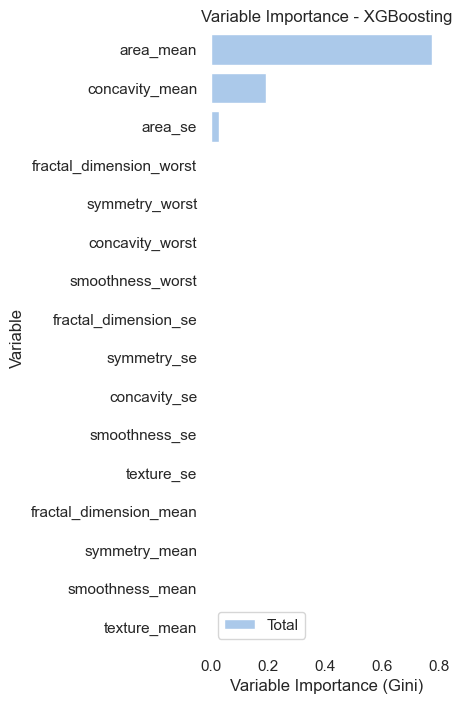

In [ ]:
# Plot variable importance
importances = XGB_BreastCancer.feature_importances_
indices = np.argsort(importances)[::-1]

f, ax = plt.subplots(figsize=(3, 8))
plt.title("Variable Importance - XGBoosting")
sns.set_color_codes("pastel")
sns.barplot(y=[Xtrain.columns[i] for i in indices], x=importances[indices],
            label="Total", color="b")
ax.set(ylabel="Variable",
       xlabel="Variable Importance (Gini)")
sns.despine(left=True, bottom=True)

In [ ]:
# Calculate probability
# Apply the model to the test set.
pred_class_test = XGB_BreastCancer.predict(Xtest_standardscale)

# Calculate predicted probabilities for each class
probTest = XGB_BreastCancer.predict_proba(Xtest_standardscale)

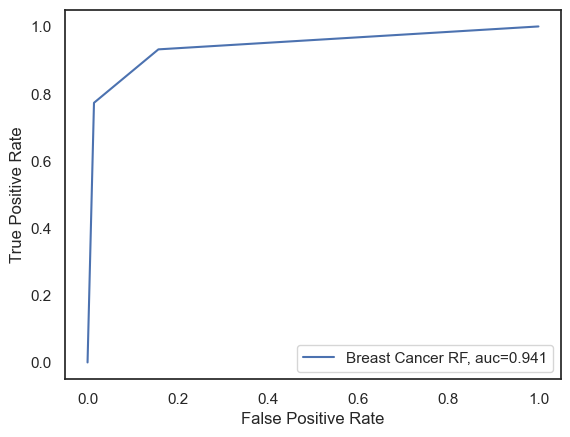

In [ ]:


# Calculate the ROC curve points
fpr, tpr, thresholds = roc_curve(ytest, probTest [:, 1], pos_label=1)

# Save the AUC in a variable to display it. Round it first
auc = np.round(roc_auc_score(ytest, probTest [:, 1]), decimals=3)

# Create and show the plot
plt.plot(fpr, tpr, label="Breast Cancer RF, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

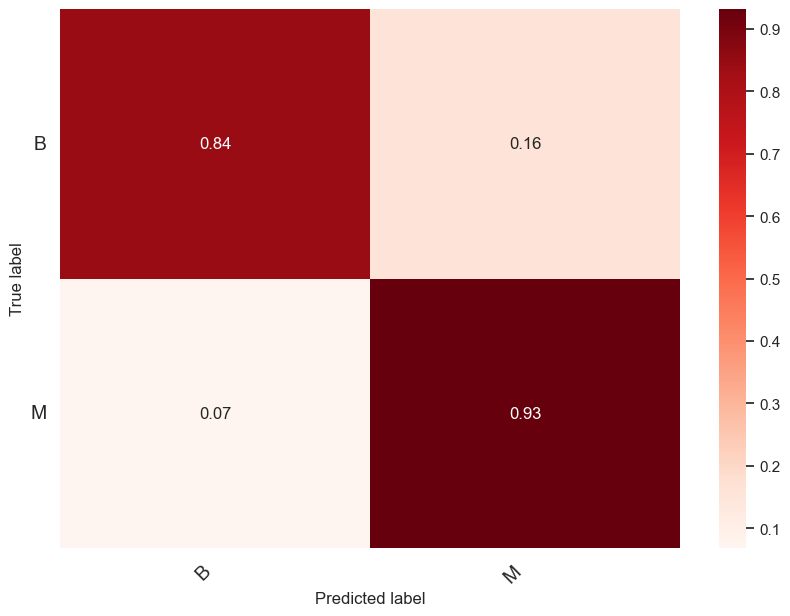

In [ ]:
# Calculate confusion matrix
confusion_matrix_rf = confusion_matrix(ytest, pred_class_test)

# Turn matrix to percentages
confusion_matrix_rf = confusion_matrix_rf.astype('float') / confusion_matrix_rf.sum(axis=1)[:, np.newaxis]

# Turn to dataframe
df_cm = pd.DataFrame(
    confusion_matrix_rf,
    index=['B', 'M'],  # Update labels to reflect 'B' (benign) and 'M' (malignant)
    columns=['B', 'M'],
)

# Parameters of the image
figsize = (10, 7)
fontsize = 14

# Create image
fig = plt.figure(figsize=figsize)
heatmap = sns.heatmap(df_cm, annot=True, fmt='.2f', cmap='Reds')

# Make it nicer
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)

# Add labels
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Plot!
plt.show()

In [ ]:
#XGBoosting Performance

from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Define the XGBoost classifier
xgb_model = XGBClassifier()

# Train the XGBoost classifier
xgb_model.fit(Xtrain_standardscale, ytrain_balanced)

# Predict classes for the test set
xgb_pred_class_test = xgb_model.predict(Xtest_standardscale)

# Calculate predicted probabilities for the test set
xgb_probs_test = xgb_model.predict_proba(Xtest_standardscale)

# Calculate accuracy
accuracy_xgb = accuracy_score(ytest, xgb_pred_class_test)
print("Test Set Accuracy Score:", accuracy_xgb)

# Calculate precision
precision_xgb = precision_score(ytest, xgb_pred_class_test)
print("Test Set Precision Score:", precision_xgb)

# Calculate recall
recall_xgb = recall_score(ytest, xgb_pred_class_test)
print("Test Set Recall Score:", recall_xgb)

# Calculate F1-score
f1_xgb = f1_score(ytest, xgb_pred_class_test)
print("Test Set F1-Score:", f1_xgb)

# Calculate confusion matrix
confusion_matrix_xgb = confusion_matrix(ytest, xgb_pred_class_test)
print("Confusion Matrix:")
print(confusion_matrix_xgb)


Test Set Accuracy Score: 0.9649122807017544
Test Set Precision Score: 0.9545454545454546
Test Set Recall Score: 0.9545454545454546
Test Set F1-Score: 0.9545454545454546
Confusion Matrix:
[[68  2]
 [ 2 42]]


## Decision Trees model

In [ ]:
# Create a decision tree classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Train the classifier
decision_tree.fit(Xtrain_standardscale, ytrain_balanced)

# Make predictions
y_pred_dt = decision_tree.predict(Xtest_standardscale)
y_pred_proba_dt = decision_tree.predict_proba(Xtest_standardscale)

# Calculate the accuracy
accuracy = accuracy_score(ytest, y_pred_dt)
print(f"Accuracy: {accuracy}")

# Calculate the classification report
report = classification_report(ytest, y_pred_dt)
print(report)

Accuracy: 0.9385964912280702
              precision    recall  f1-score   support

           0       0.96      0.94      0.95        70
           1       0.91      0.93      0.92        44

    accuracy                           0.94       114
   macro avg       0.93      0.94      0.94       114
weighted avg       0.94      0.94      0.94       114



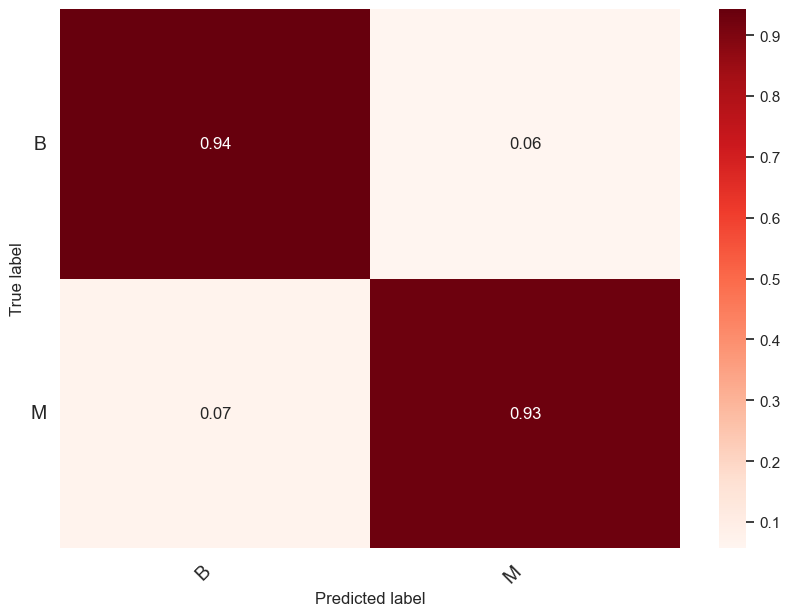

In [ ]:
# Calculate confusion matrix
confusion_matrix_dt = confusion_matrix(ytest, y_pred_dt)

# Turn matrix to percentages
confusion_matrix_dt = confusion_matrix_dt.astype('float') / confusion_matrix_dt.sum(axis=1)[:, np.newaxis]

# Turn to dataframe
df_dt = pd.DataFrame(
    confusion_matrix_dt,
    index=['B', 'M'],  # Update labels to reflect 'B' (benign) and 'M' (malignant)
    columns=['B', 'M'],
)

# Parameters of the image
figsize = (10, 7)
fontsize = 14

# Create image
fig = plt.figure(figsize=figsize)
heatmap = sns.heatmap(df_dt, annot=True, fmt='.2f', cmap='Reds')

# Make it nicer
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)

# Add labels
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Plot!
plt.show()

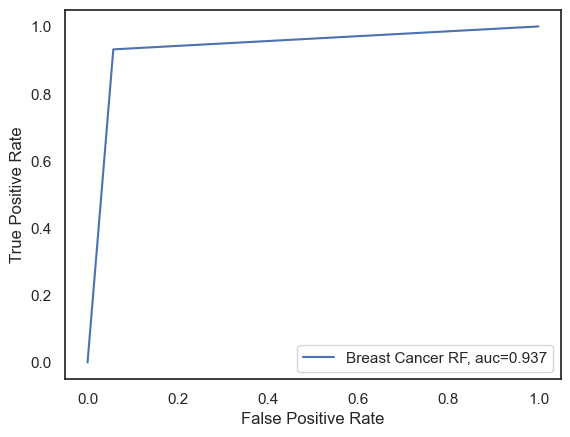

In [ ]:
# Calculate the ROC curve points
fpr, tpr, thresholds = roc_curve(ytest, y_pred_proba_dt[:,1], pos_label=1)

# Save the AUC in a variable to display it. Round it first
auc = np.round(roc_auc_score(ytest, y_pred_proba_dt[:,1]), decimals=3)

# Create and show the plot
plt.plot(fpr, tpr, label="Breast Cancer RF, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [ ]:
#Decision Trees model Performance

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Create a decision tree classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Train the classifier
decision_tree.fit(Xtrain_standardscale, ytrain_balanced)

# Make predictions
y_pred_dt = decision_tree.predict(Xtest_standardscale)
y_pred_proba_dt = decision_tree.predict_proba(Xtest_standardscale)

# Calculate the accuracy
accuracy = accuracy_score(ytest, y_pred_dt)
print(f"Accuracy: {accuracy}")

# Calculate other performance metrics
precision = precision_score(ytest, y_pred_dt)
recall = recall_score(ytest, y_pred_dt)
f1 = f1_score(ytest, y_pred_dt)

# Print the metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")

# Calculate confusion matrix for Decision Tree
confusion_matrix_dt = confusion_matrix(ytest, y_pred_dt)

print("Confusion Matrix:")
print(confusion_matrix_dt)


Accuracy: 0.9385964912280702
Precision: 0.9111111111111111
Recall: 0.9318181818181818
F1-Score: 0.9213483146067416
Confusion Matrix:
[[66  4]
 [ 3 41]]


## Support Vector Machine(SVM)

In [ ]:
# Create the SVM classifier with a linear kernel
svm_classifier = SVC(kernel='linear', random_state=42)

# Fit the classifier to the training data
svm_classifier.fit(Xtrain_standardscale, ytrain_balanced)

# Predict on the test data
y_pred_svm = svm_classifier.predict(Xtest_standardscale)
y_pred_proba_svm = svm_classifier.decision_function(Xtest_standardscale)

# Evaluate the model
accuracy = accuracy_score(ytest, y_pred_svm)
report = classification_report(ytest, y_pred_svm)

print(f"Accuracy: {accuracy}\n")
print(f"Classification Report: \n{report}")

Accuracy: 0.9649122807017544

Classification Report: 
              precision    recall  f1-score   support

           0       0.99      0.96      0.97        70
           1       0.93      0.98      0.96        44

    accuracy                           0.96       114
   macro avg       0.96      0.97      0.96       114
weighted avg       0.97      0.96      0.97       114



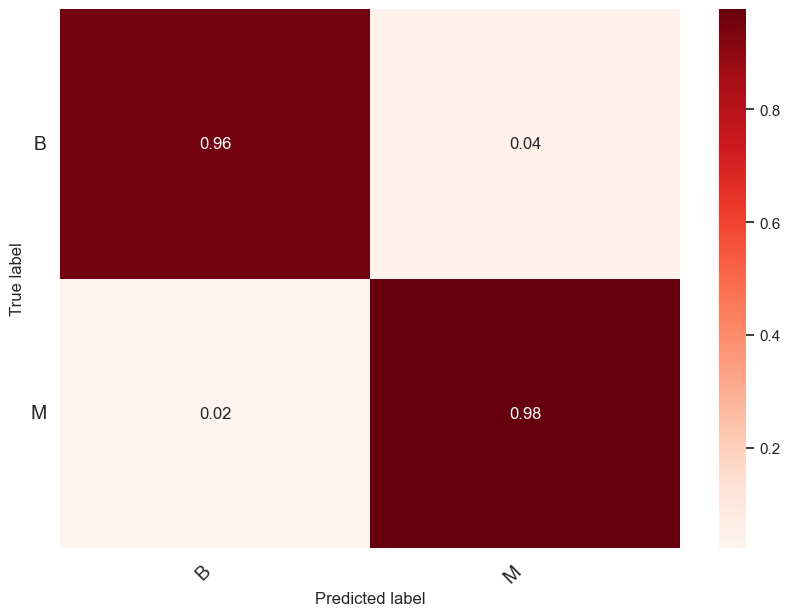

In [ ]:
# Calculate confusion matrix
confusion_matrix_svm = confusion_matrix(ytest, y_pred_svm)

# Turn matrix to percentages
confusion_matrix_svm = confusion_matrix_svm.astype('float') / confusion_matrix_svm.sum(axis=1)[:, np.newaxis]

# Turn to dataframe
df_svm = pd.DataFrame(
    confusion_matrix_svm,
    index=['B', 'M'],  # Update labels to reflect 'B' (benign) and 'M' (malignant)
    columns=['B', 'M'],
)

# Parameters of the image
figsize = (10, 7)
fontsize = 14

# Create image
fig = plt.figure(figsize=figsize)
heatmap = sns.heatmap(df_svm, annot=True, fmt='.2f', cmap='Reds')

# Make it nicer
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)

# Add labels
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Plot!
plt.show()

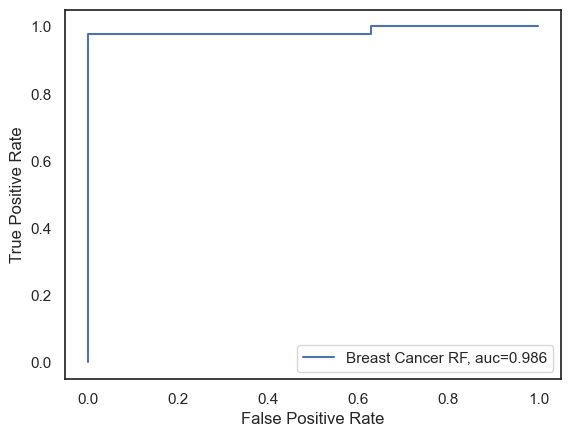

In [ ]:
# Calculate the ROC curve points
fpr, tpr, thresholds = roc_curve(ytest, y_pred_proba_svm, pos_label=1)

# Save the AUC in a variable to display it. Round it first
auc = np.round(roc_auc_score(ytest, y_pred_proba_svm), decimals=3)

# Create and show the plot
plt.plot(fpr, tpr, label="Breast Cancer RF, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [ ]:
#Support Vector Machine(SVM) Performance

from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Create the SVM classifier with a linear kernel
svm_classifier = SVC(kernel='linear', random_state=42)

# Fit the classifier to the training data
svm_classifier.fit(Xtrain_standardscale, ytrain_balanced)

# Predict on the test data
y_pred_svm = svm_classifier.predict(Xtest_standardscale)
y_pred_proba_svm = svm_classifier.decision_function(Xtest_standardscale)

# Evaluate the model
accuracy = accuracy_score(ytest, y_pred_svm)
precision = precision_score(ytest, y_pred_svm)
recall = recall_score(ytest, y_pred_svm)
f1 = f1_score(ytest, y_pred_svm)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")

# Calculate confusion matrix for SVM
confusion_matrix_svm = confusion_matrix(ytest, y_pred_svm)
print("Confusion Matrix:")
print(confusion_matrix_svm)


Accuracy: 0.9649122807017544
Precision: 0.9347826086956522
Recall: 0.9772727272727273
F1-Score: 0.9555555555555557
Confusion Matrix:
[[67  3]
 [ 1 43]]


## Nerual Networ Model

This step takes too much time, that's why we comment it

In [ ]:
#check and see the scaled feature distribution

# sns.displot(X)
# plt.title("Before Scaling")
# plt.xlabel("Value")
# sns.displot(Xtrain_scaled)
# plt.title("After Scaling")
# plt.xlabel("Value")

In [33]:
# Print shapes of training data and labels
print("Shape of Xtrain_scaled:", Xtrain_standardscale.shape)
print("Shape of ytrain_balanced:", ytrain_balanced.shape)

# Print the number of input neurons
print("Number of input neurons:", Xtrain_standardscale.shape[1])

# Print shapes of testing data and labels
print("Shape of Xtest_scaled:", Xtest_standardscale.shape)
print("Shape of ytest:", ytest.shape)


Shape of Xtrain_scaled: (574, 16)
Shape of ytrain_balanced: (574, 1)
Number of input neurons: 16
Shape of Xtest_scaled: (114, 16)
Shape of ytrain_balanced: (114, 1)


## Sequential Nerual Networ with Tuned Parameters

In [59]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
#create a sequential model object
model_ss = Sequential()

#add an input layer specifying 16 units and a sigmoid activation function
model_ss.add(Dense(16, input_shape=(Xtrain_standardscale.shape[1],), activation = 'relu'))

#add a hidden layer with 10 units and a sigmoid activation function
model_ss.add(Dense(10, activation='relu'))


#add an output layer with 1 hidden units
model_ss.add(Dense(1, activation='relu'))

#compile the model specifying an optimizer and a loss function
model_ss.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
#fit the model on the data and specify the number of training iterations (epochs)
model_ss.fit(Xtrain_standardscale, ytrain_balanced, epochs = 200, batch_size=15, verbose=0)
#evaluate the model's performance on the test data
model_ss.evaluate(Xtest_standardscale, ytest)

# Evaluate the model's performance
# Evaluate the model's performance
loss_ss, accuracy_ss = model_ss.evaluate(Xtest_standardscale, ytest, verbose=0)  # Accuracy is the second element of the output
y_pred_prob_ss = model_ss.predict(Xtest_standardscale)
y_pred_ss = (y_pred_prob_ss > 0.5).astype('int32')
precision_ss = precision_score(ytest, y_pred_ss)
recall_ss = recall_score(ytest, y_pred_ss)
f1_ss = f1_score(ytest, y_pred_ss)

# Print evaluation metrics for the model
print(f"Accuracy: {accuracy_ss}")
print(f"Precision: {precision_ss}")
print(f"Recall: {recall_ss}")
print(f"F1-Score: {f1_ss}")

# Calculate confusion matrix for sequential model
confusion_matrix_ss = confusion_matrix(ytest, y_pred_ss)
print("Confusion Matrix:")
print(confusion_matrix_ss)



4/4 [==============================] - 0s 2ms/step
Accuracy: 0.9824561476707458
Precision: 0.9772727272727273
Recall: 0.9772727272727273
F1-Score: 0.9772727272727273
Confusion Matrix:
[[69  1]
 [ 1 43]]


## Tuning Parameters for Sequential NN Model

In [51]:
# Use scikit-learn to grid search the number of neurons
import numpy as np
import tensorflow as tf
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.constraints import MaxNorm
# Function to create model, required for KerasClassifier
def create_model(neurons,optimizer='rmsprop',activation='relu'):
    # create model
    model = Sequential()
    model.add(Dense(16, input_shape=(Xtrain_standardscale.shape[1],), activation = 'sigmoid'))
    model.add(Dense(neurons, activation=activation)) #hidden layer 1
    model.add(Dense(1, activation='sigmoid'))
    # Compile model
    model.compile(optimizer=optimizer,loss='binary_crossentropy', metrics=['accuracy'])
   # model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

# create model
model = KerasClassifier(model=create_model, epochs=200, batch_size=20, verbose=0,loss='binary_crossentropy', metrics=['accuracy'])
# define the grid search parameters
param_grid = {
    'model__neurons': [ 10, 15, 20],
    'model__optimizer': ['SGD', 'adam'],
    'model__activation': [ 'relu', 'tanh', 'sigmoid'],
    'epochs': [100, 200],
    'batch_size': [15,20]
}

# Set random seed for reproducibility
tf.random.set_seed(42)
# Perform grid search using GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=3, scoring='accuracy')
grid_result = grid.fit(Xtrain_standardscale, ytrain_balanced)

# summarize results
#print("Best: %f using %s" % ( grid_result.best_params_))

# Print the best parameters found by grid search
print(grid_result.best_params_)
# Print the accuracy score of the best model
print("Accuracy:", grid.best_score_)

{'batch_size': 15, 'epochs': 200, 'model__activation': 'relu', 'model__neurons': 10, 'model__optimizer': 'adam'}
Accuracy: 0.975621727748691


##  Sequential Neural Network Without Tuned Parameters


In [55]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
#create a sequential model object
model_ss = Sequential()
#add an input layer specifying 16 units and a sigmoid activation function

model_ss.add(Dense(16, input_shape=(Xtrain_standardscale.shape[1],), activation = 'sigmoid'))

#add a hidden layer with 15 units and a sigmoid activation function
model_ss.add(Dense(15, activation='relu'))


#add an output layer with 1 hidden units, one for each of the possible predictions with a sigmoid activation
model_ss.add(Dense(1, activation='sigmoid'))
#tf.random.set_seed(42)
#compile the model specifying an optimizer and a loss function
model_ss.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
#fit the model on the data and specify the number of training iterations (epochs)
model_ss.fit(Xtrain_standardscale, ytrain_balanced, epochs = 200, batch_size=20, verbose=0)
#evaluate the model's performance on the test data
model_ss.evaluate(Xtest_standardscale, ytest)


# Evaluate the model's performance

# Evaluate the model on the test set
loss_ss, accuracy_ss = model_ss.evaluate(Xtest_standardscale, ytest, verbose=0)  # Accuracy is the second element of the output

# Predict probabilities and convert to binary predictions based on a threshold of 0.5
y_pred_prob_ss = model_ss.predict(Xtest_standardscale)
y_pred_ss = (y_pred_prob_ss > 0.5).astype('int32')

# Calculate precision, recall, and F1-score
precision_ss = precision_score(ytest, y_pred_ss)
recall_ss = recall_score(ytest, y_pred_ss)
f1_ss = f1_score(ytest, y_pred_ss)

# Print evaluation metrics for the standardized model on the test set
print(f"Accuracy: {accuracy_ss}")
print(f"Precision: {precision_ss}")
print(f"Recall: {recall_ss}")
print(f"F1-Score: {f1_ss}")

# Calculate confusion matrix for sequential model
confusion_matrix_ss = confusion_matrix(ytest, y_pred_ss)
print("Confusion Matrix:")
print(confusion_matrix_ss)

4/4 [==============================] - 0s 2ms/step
Accuracy: 0.9736841917037964
Precision: 0.9555555555555556
Recall: 0.9772727272727273
F1-Score: 0.9662921348314608
Confusion Matrix:
[[68  2]
 [ 1 43]]


## Neural Network - MLPRegressor with Tuned Parameters

In [18]:
#Model1 : MLPRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
# Create an instance of MLPRegressor
mlp_model = MLPClassifier(hidden_layer_sizes=(20), activation='relu', solver='adam', alpha=0.01, random_state=42,learning_rate_init=0.01,batch_size=20, max_iter=200)

# Fit the model on the scaled training data
mlp_model.fit(Xtrain_standardscale, ytrain_balanced)

# Predict on the test data
y_pred_mlp = mlp_model.predict(Xtest_standardscale)

# Evaluate the model's performance
mse = mean_squared_error(ytest, y_pred_mlp)
mae = mean_absolute_error(ytest, y_pred_mlp)

# Print mean squared error and mean absolute error
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)


# Evaluate the model's performance

# Calculate evaluation metrics for MLP model
accuracy_mlp = accuracy_score(ytest, y_pred_mlp)
precision_mlp = precision_score(ytest, y_pred_mlp)
recall_mlp = recall_score(ytest, y_pred_mlp)
f1_mlp = f1_score(ytest, y_pred_mlp)

# Print evaluation metrics for the MLP model
print(f"Accuracy: {accuracy_mlp}")
print(f"Precision: {precision_mlp}")
print(f"Recall: {recall_mlp}")
print(f"F1-Score: {f1_mlp}")

# Calculate confusion matrix for MLPClassifier
confusion_matrix_mlp = confusion_matrix(ytest, y_pred_mlp)
print("Confusion Matrix:")
print(confusion_matrix_mlp)

Mean Squared Error: 0.02631578947368421
Mean Absolute Error: 0.02631578947368421
Accuracy: 0.9736842105263158
Precision: 0.9555555555555556
Recall: 0.9772727272727273
F1-Score: 0.9662921348314608
Confusion Matrix:
[[68  2]
 [ 1 43]]


## Tuning Parameters for MLPClassifier NN Model

In [17]:
# Tuning Parameter (MLPRegressor)

from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Function to create model, required for GridSearchCV
def create_model(hidden_layer_size1=(5,), activation='relu',solver='adam'):
    # Create an instance of MLPRegressor with fixed second hidden layer size
    mlp_model = MLPClassifier(hidden_layer_sizes=(hidden_layer_sizes), activation=activation, solver=solver,
                             alpha=0.01, random_state=42, batch_size=20,max_iter=200)
    return mlp_model

# Create model
model = MLPClassifier()

# Define the grid search parameters
param_grid = {
    'hidden_layer_sizes': [ 5, 10, 15, 20, 25, 30],  # Adjust the first hidden layer size here
    'activation': ['softmax', 'relu', 'tanh', 'sigmoid'],
    'solver':['rmsprop', 'SGD','adam']
    }

# Create the GridSearchCV object
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3,scoring='accuracy')
grid_result = grid.fit(Xtrain_standardscale, ytrain_balanced)

# Print the best parameters found
print("Best Parameters:", grid_result.best_params_)

# Evaluate the model's performance on the test data

print("Accuracy:", grid.best_score_)

Best Parameters: {'activation': 'relu', 'hidden_layer_sizes': 20, 'solver': 'adam'}
Accuracy: 0.9703952152414194
